In [324]:
import pandas as pd
import numpy as np
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from datetime import date

Non-technical audience.

Dave lives in Austin, Texas. Dave and his family have the opportunity to purchase 2021 pool passes to a local waterpark. They can choose to buy an annual pass or a monthly pass. The annual pass is $240.00 per person, while the monthly pass is $50.00 per person. There are four people in his family. The local waterpark is open every day.

While Austin enjoys nice weather frequently, the minumum outdoor temperature to comfortably swim is 78 degrees. 

Based on the weather dataset for the previous three years, is better for Dave to purchase the annual passes or monthly passes?

In [325]:
df = pd.read_csv('weather.csv')

In [326]:
df.head()

,Unnamed: 0,Date,HighTemp,AvgTemp,LowTemp,HightDpt,AvgDpt,LowDpt,AvgHum,AvgWind,TotalPrecip,HighPres,AvgPres,LowPres,WindDir,WindSpeed,Visibility
0,0,2018-04-17,84,69,54,62,58,54,71,13,0.0,29,29,29,180.0,15,10
1,1,2018-04-18,81,70,57,65,56,42,65,4,0.0,30,29,29,160.0,10,10
2,2,2018-04-19,76,64,53,43,39,35,42,7,0.0,30,30,30,30.0,12,10
3,3,2018-04-20,67,60,51,50,46,42,62,1,0.0,30,30,29,110.0,8,10
4,4,2018-04-21,71,65,59,69,62,52,92,2,0.0,29,29,29,NaN,6,6


In [327]:
df.describe()

,Unnamed: 0,HighTemp,AvgTemp,LowTemp,HightDpt,AvgDpt,LowDpt,AvgHum,AvgWind,TotalPrecip,HighPres,AvgPres,LowPres,WindDir,WindSpeed,Visibility
count,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,442.000000,729.000000,729.000000
mean,364.000000,80.482853,68.866941,58.425240,62.775034,57.658436,51.367627,71.246914,3.145405,0.091646,29.460905,29.278464,29.093278,174.570136,8.117970,9.008230
std,210.588461,15.206637,14.273530,15.603086,13.713068,14.682629,15.946919,11.936275,4.048230,0.335562,0.498812,0.460637,1.573151,96.432608,3.578756,1.616344
min,0.000000,39.000000,34.000000,0.000000,23.000000,16.000000,0.000000,31.000000,0.000000,0.000000,29.000000,27.000000,0.000000,10.000000,2.000000,1.000000
25%,182.000000,69.000000,56.000000,46.000000,54.000000,46.000000,37.000000,64.000000,0.000000,0.000000,29.000000,29.000000,29.000000,150.000000,5.000000,9.000000
50%,364.000000,82.000000,71.000000,61.000000,68.000000,63.000000,56.000000,71.000000,2.000000,0.000000,29.000000,29.000000,29.000000,170.000000,8.000000,10.000000
75%,546.000000,95.000000,82.000000,73.000000,74.000000,70.000000,66.000000,81.000000,4.000000,0.000000,30.000000,30.000000,29.000000,200.000000,11.000000,10.000000
max,728.000000,109.000000,93.000000,84.000000,79.000000,77.000000,76.000000,95.000000,26.000000,3.950000,30.000000,30.000000,30.000000,360.000000,20.000000,10.000000


In [328]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 729 entries, 0 to 728
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   729 non-null    int64  
 1   Date         729 non-null    object 
 2   HighTemp     729 non-null    int64  
 3   AvgTemp      729 non-null    int64  
 4   LowTemp      729 non-null    int64  
 5   HightDpt     729 non-null    int64  
 6   AvgDpt       729 non-null    int64  
 7   LowDpt       729 non-null    int64  
 8   AvgHum       729 non-null    int64  
 9   AvgWind      729 non-null    int64  
 10  TotalPrecip  729 non-null    float64
 11  HighPres     729 non-null    int64  
 12  AvgPres      729 non-null    int64  
 13  LowPres      729 non-null    int64  
 14  WindDir      442 non-null    float64
 15  WindSpeed    729 non-null    int64  
 16  Visibility   729 non-null    int64  
dtypes: float64(2), int64(14), object(1)
memory usage: 96.9+ KB


In [329]:
df.columns

Index(['Unnamed: 0', 'Date', 'HighTemp', 'AvgTemp', 'LowTemp', 'HightDpt',
       'AvgDpt', 'LowDpt', 'AvgHum', 'AvgWind', 'TotalPrecip', 'HighPres',
       'AvgPres', 'LowPres', 'WindDir', 'WindSpeed', 'Visibility'],
      dtype='object')

In [330]:
#The column 'Unnamed: 0' does not seem to contain any helpful information, so will be dropping it.
df['Unnamed: 0']

0        0
1        1
2        2
3        3
4        4
      ... 
724    724
725    725
726    726
727    727
728    728
Name: Unnamed: 0, Length: 729, dtype: int64

In [331]:
df = df.drop(columns = ['Unnamed: 0'])

In [332]:
#Checking for consistent datatypes
df.dtypes

Date            object
HighTemp         int64
AvgTemp          int64
LowTemp          int64
HightDpt         int64
AvgDpt           int64
LowDpt           int64
AvgHum           int64
AvgWind          int64
TotalPrecip    float64
HighPres         int64
AvgPres          int64
LowPres          int64
WindDir        float64
WindSpeed        int64
Visibility       int64
dtype: object

In [333]:
#Converting 'Date' to datetime format
df.Date = pd.to_datetime(df.Date)

In [334]:
pd.unique(df.TotalPrecip)

array([0.  , 0.24, 0.32, 0.03, 2.56, 0.01, 0.48, 0.15, 0.11, 0.02, 0.04,
       0.19, 0.22, 0.63, 0.06, 0.42, 0.58, 0.23, 0.78, 0.07, 0.34, 0.49,
       1.59, 0.21, 0.28, 0.41, 0.1 , 0.12, 0.27, 0.6 , 0.05, 0.53, 0.47,
       0.14, 2.55, 0.33, 0.16, 1.  , 0.3 , 0.57, 0.51, 1.08, 0.13, 1.26,
       2.84, 1.91, 0.29, 0.66, 1.69, 0.38, 0.43, 0.75, 1.18, 1.09, 1.87,
       3.95, 0.77, 1.58, 0.44, 0.82, 0.39, 0.86, 0.55, 1.27, 0.91, 0.18,
       0.17, 2.09, 0.4 , 0.45, 0.08, 0.36, 0.7 , 0.2 , 0.26, 0.88, 0.83,
       0.99, 2.36])

In [337]:
#Checking for missing values
pd.unique(df.WindDir)

array([180., 160.,  30., 110.,  nan, 350., 150., 320., 210., 190., 170.,
       140.,  40., 130., 260., 100., 200.,  70., 230.,  50., 310., 340.,
        10., 360.,  20., 330., 240., 290., 280., 220.])

In [338]:
#Filling NAN with mean windspeed
df.WindDir = df.WindDir.fillna(np.mean(df.WindDir))

In [339]:
pd.unique(df.WindDir)

array([180.        , 160.        ,  30.        , 110.        ,
       174.57013575, 350.        , 150.        , 320.        ,
       210.        , 190.        , 170.        , 140.        ,
        40.        , 130.        , 260.        , 100.        ,
       200.        ,  70.        , 230.        ,  50.        ,
       310.        , 340.        ,  10.        , 360.        ,
        20.        , 330.        , 240.        , 290.        ,
       280.        , 220.        ])

In [341]:
df.WindDir = df.WindDir.round()

In [345]:
df.WindDir = df.WindDir.astype(int)

In [346]:
df.dtypes

Date           datetime64[ns]
HighTemp                int64
AvgTemp                 int64
LowTemp                 int64
HightDpt                int64
AvgDpt                  int64
LowDpt                  int64
AvgHum                  int64
AvgWind                 int64
TotalPrecip           float64
HighPres                int64
AvgPres                 int64
LowPres                 int64
WindDir                 int64
WindSpeed               int64
Visibility              int64
dtype: object

In [347]:
df.profile_report()

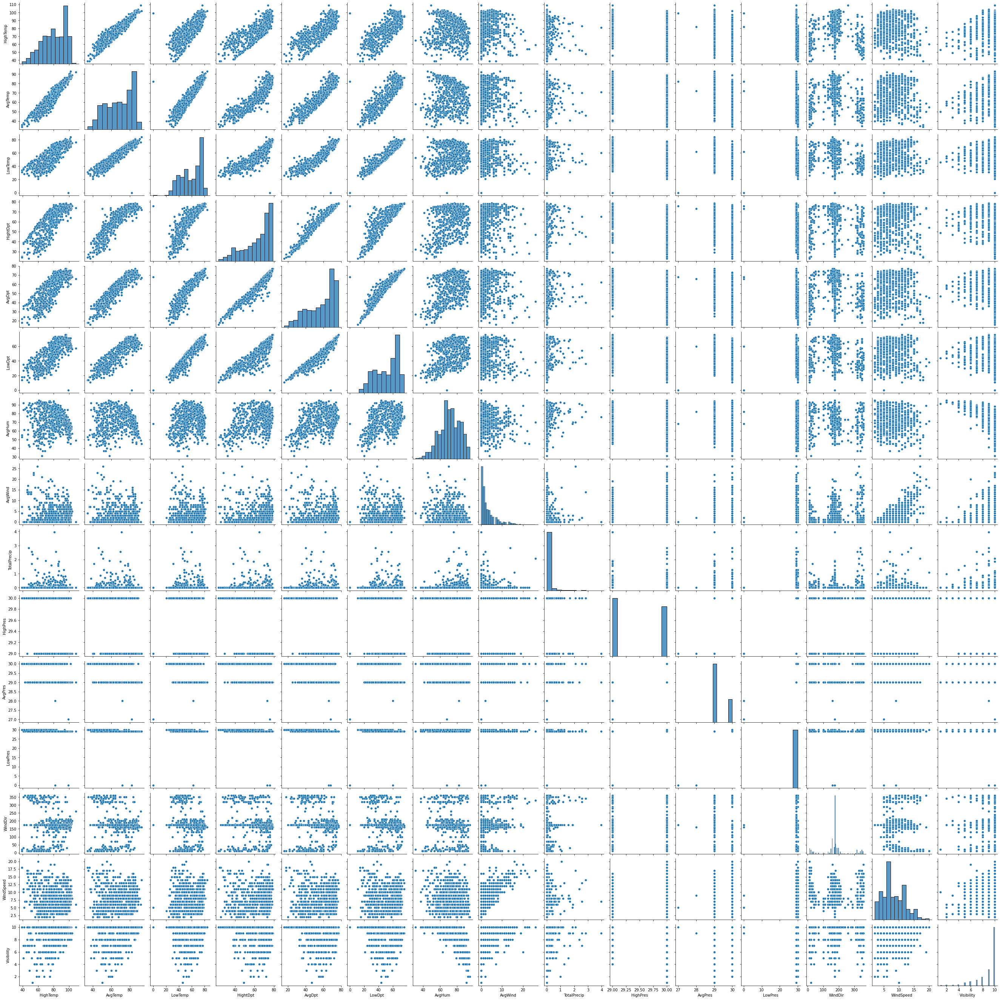

In [348]:
sns.pairplot(df)

In [349]:
#Add day, month, and year column
df['Day'] = df.Date.dt.day
df['Month'] = df.Date.dt.month
df['Year'] = df.Date.dt.year

In [350]:
df.describe()

,HighTemp,AvgTemp,LowTemp,HightDpt,AvgDpt,LowDpt,AvgHum,AvgWind,TotalPrecip,HighPres,AvgPres,LowPres,WindDir,WindSpeed,Visibility,Day,Month,Year
count,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000,729.000000
mean,80.482853,68.866941,58.425240,62.775034,57.658436,51.367627,71.246914,3.145405,0.091646,29.460905,29.278464,29.093278,174.739369,8.117970,9.008230,15.739369,6.526749,2018.788752
std,15.206637,14.273530,15.603086,13.713068,14.682629,15.946919,11.936275,4.048230,0.335562,0.498812,0.460637,1.573151,75.054929,3.578756,1.616344,8.821994,3.454120,0.674769
min,39.000000,34.000000,0.000000,23.000000,16.000000,0.000000,31.000000,0.000000,0.000000,29.000000,27.000000,0.000000,10.000000,2.000000,1.000000,1.000000,1.000000,2018.000000
25%,69.000000,56.000000,46.000000,54.000000,46.000000,37.000000,64.000000,0.000000,0.000000,29.000000,29.000000,29.000000,160.000000,5.000000,9.000000,8.000000,4.000000,2018.000000
50%,82.000000,71.000000,61.000000,68.000000,63.000000,56.000000,71.000000,2.000000,0.000000,29.000000,29.000000,29.000000,175.000000,8.000000,10.000000,16.000000,7.000000,2019.000000
75%,95.000000,82.000000,73.000000,74.000000,70.000000,66.000000,81.000000,4.000000,0.000000,30.000000,30.000000,29.000000,180.000000,11.000000,10.000000,23.000000,10.000000,2019.000000
max,109.000000,93.000000,84.000000,79.000000,77.000000,76.000000,95.000000,26.000000,3.950000,30.000000,30.000000,30.000000,360.000000,20.000000,10.000000,31.000000,12.000000,2020.000000


In [466]:
#As 2018 and 2020 are a partial year, need to calculate number of days for comparison

start_date = date(2018,4,16)
end_date = date(2018,12,31)

days_2018 = end_date - start_date
#259 recorded days in 2018

start_date2 = date(2019,12,31)
end_date2 = date(2020,4,14)

days_2020 = end_date2 - start_date2
#105 recorded days in 2020

print('This dataset covers',259+365+105,'days')

This dataset covers 729 days


In [352]:
df['AvgTemp_78'] = np.where(df['AvgTemp'] >= 78, 'Swimming Weather', 'Not Swimming Weather')

In [353]:
pd.value_counts(df.AvgTemp_78)

Not Swimming Weather    452
Swimming Weather        277
Name: AvgTemp_78, dtype: int64

In [315]:
df_2018 = df[df['Year'] == 2018]
df_2019 = df[df['Year'] == 2019]
df_2020 = df[df['Year'] == 2020]

In [461]:
print(pd.value_counts(df_2018.AvgTemp_78))
print(pd.value_counts(df_2019.AvgTemp_78))
print(pd.value_counts(df_2020.AvgTemp_78))

Swimming Weather        134
Not Swimming Weather    125
Name: AvgTemp_78, dtype: int64
Not Swimming Weather    223
Swimming Weather        142
Name: AvgTemp_78, dtype: int64
Not Swimming Weather    104
Swimming Weather          1
Name: AvgTemp_78, dtype: int64


Text(0.5, 1.0, 'Count of Days With Swimming Weather By Month, 2018-2020')

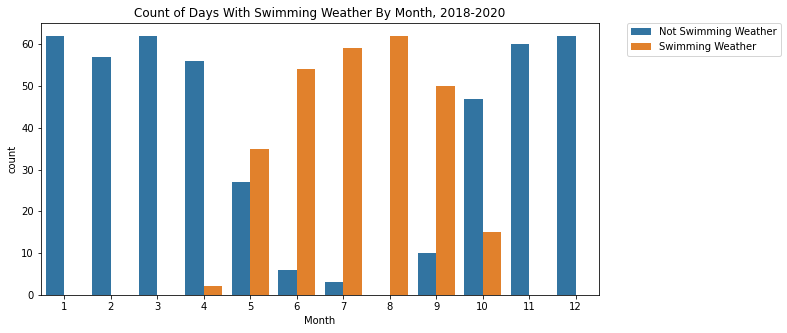

In [440]:
fig_dims = (10, 5)
fig, ax = plt.subplots(figsize=fig_dims)
p = sns.countplot(x='Month', hue='AvgTemp_78', data=df, ax=ax)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Count of Days With Swimming Weather By Month, 2018-2020')

Text(0.5, 1.0, '2020')

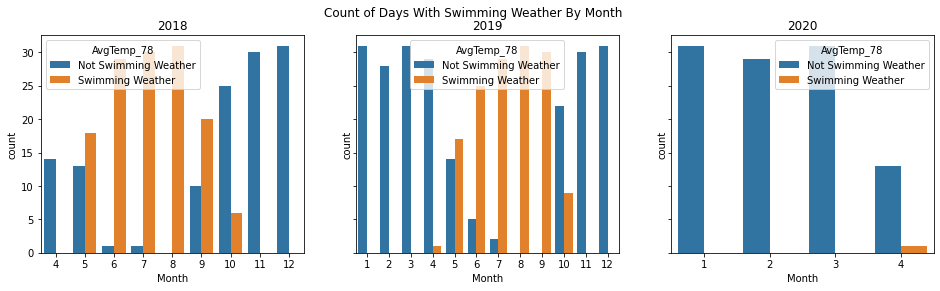

In [444]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4), sharey=True)
fig.suptitle('Count of Days With Swimming Weather By Month')

#2018
sns.countplot(ax=axes[0], x='Month', hue='AvgTemp_78', data=df_2018)
axes[0].set_title('2018')

#2019
sns.countplot(ax=axes[1], x='Month', hue='AvgTemp_78', data=df_2019)
axes[1].set_title('2019')

#2020
sns.countplot(ax=axes[2], x='Month', hue='AvgTemp_78', data=df_2020)
axes[2].set_title('2020')

Text(0.5, 1.0, 'Count of Days With Swimming Weather Stacked By Month, 2018-2020')

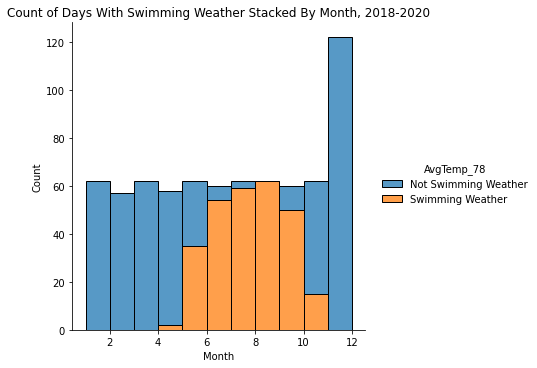

In [475]:
#sns.displot(df, x='Month', hue='AvgTemp_78', multiple='stack')
#plt.title('Count of Days With Swimming Weather Stacked By Month, 2018-2020')

Based on the dataset, Dave and his family will be able to swim comfortably from May through September. They may also see days warm enough to swim in April and October, though much fewer than through the summer months.  

Cost of annual pass: $240.00(4 family members) = $960.00
Cost of monthly pass for five months: 5 months(4 family members) = 20($50.00) = $1000.00

It makes the most sense for Dave to purchase the annual pass for the water park.